<a href="https://colab.research.google.com/github/LordVernon/CV_Book/blob/main/3DML_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install torch torchvision
!pip install rtree
!pip install trimesh
!pip install git+https://github.com/facebookresearch/pytorch3d.git@v0.2.0
!pip install celluloid
!pip install tqdm

  Cloning https://github.com/facebookresearch/pytorch3d.git (to revision v0.2.0) to /tmp/pip-req-build-ie_vpmuq
  Running command git clone -q https://github.com/facebookresearch/pytorch3d.git /tmp/pip-req-build-ie_vpmuq
  Running command git checkout -q 686c8666d31d932ed42d3cd7319f249fc75e89a9
ERROR: Operation cancelled by user


In [ ]:
!pip install celluloid

In [ ]:
import os
import pathlib
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

# You should work in Jupyter.
from tqdm import tqdm_notebook

from celluloid import Camera

import torch

# untilitis 
from pytorch3d.utils import ico_sphere

# loss functions and regulaziers
from pytorch3d.loss import (
    chamfer_distance,
    mesh_edge_loss,
    mesh_laplacian_smoothing,
    mesh_normal_consistency
)

# io utils
from pytorch3d.io import load_obj

# operations with data
from pytorch3d.ops import sample_points_from_meshes

# datastructures
from pytorch3d.structures import Meshes, Textures

# render 
from pytorch3d.renderer import (
    look_at_view_transform,
    OpenGLPerspectiveCameras,
    DirectionalLights, 
    RasterizationSettings, 
    MeshRenderer, 
    MeshRasterizer,  
    HardPhongShader
)

import trimesh
from trimesh import registration
from trimesh import visual

# If you have got a CUDA device, you can use GPU mode
if torch.cuda.is_available():
  device = torch.device('cuda:0')
  torch.cuda.set_device(device)
else:
  device = torch.device('cpu')

In [ ]:
!wget -nc -P ./data/ https://graphics.stanford.edu/~mdfisher/Data/Meshes/bunny.obj

File ‘./data/bunny.obj’ already there; not retrieving.



In [ ]:
path_to_model = os.path.join("Stone.obj")
path_to_orig = pathlib.Path("data", "mesh_source.obj")
path_to_rot = pathlib.Path("data", "mesh_target.obj")

In [ ]:
verts, faces_idx, _ = load_obj(path_to_model)
faces = faces_idx.verts_idx

center = verts.mean(0)
verts = verts - center
scale = max(verts.abs().max(0)[0])
verts = verts / scale

# Initialize each vertex to be white in color.
verts_rgb = torch.ones_like(verts)[None]  # (1, V, 3)

textures = Textures(verts_rgb=verts_rgb.to(device))

# Create a Meshes object for the bunny.
bunny_mesh = Meshes(
    verts=[verts.to(device)],   
    faces=[faces.to(device)], 
    textures=textures
)

# Sphere mesh in pytorch3d

sphere_mesh = ico_sphere(4, device)
verts_rgb = torch.ones_like(sphere_mesh.verts_list()[0])[None]
sphere_mesh.textures = Textures(verts_rgb=verts_rgb.to(device))

# Mesh to pointcloud with normals in pytorch3d
num_points_to_sample = 25000

bunny_vert, bunny_norm = sample_points_from_meshes(
    bunny_mesh,
    num_points_to_sample ,
    return_normals=True
)

sphere_vert, sphere_norm = sample_points_from_meshes(
    sphere_mesh,
    num_points_to_sample,
    return_normals=True
)

def convert_to_mesh(mesh):
    """Trimesh может загружать сцены вместо монолитного объекта
    """
    if isinstance(mesh, trimesh.Scene):
        return mesh.dump(concatenate=True)
    else:
        return mesh

def scale_to_unit(mesh: trimesh.Trimesh):
    length, weight, height = mesh.extents
    scale = 1 / max(length, weight, height)
    mesh.apply_scale((scale, scale, scale))

mesh_target = convert_to_mesh(trimesh.load_mesh(path_to_orig))
mesh_source = convert_to_mesh(trimesh.load_mesh(path_to_rot))

mesh_target.rezero()
mesh_source.rezero()
scale_to_unit(mesh_target)
scale_to_unit(mesh_source)

mesh_source.visual = visual.ColorVisuals(mesh_source, vertex_colors=(255, 0, 0, 255))
mesh_target.visual = visual.ColorVisuals(mesh_target, vertex_colors=(0, 255, 0, 255))

scene = trimesh.Scene([mesh_source, mesh_target])

/usr/local/lib/python3.6/dist-packages/pytorch3d/io/obj_io.py:484: UserWarning: Mtl file does not exist: Stone.mtl
  warnings.warn(f"Mtl file does not exist: {f_mtl}")
unable to load materials from: orbiter_bugship.mtl
faces have mixed data, using slow fallback!
faces have mixed data, using slow fallback!
faces have mixed data, using slow fallback!
faces have mixed data, using slow fallback!
faces have mixed data, using slow fallback!
faces have mixed data, using slow fallback!
faces have mixed data, using slow fallback!
specified material (default_feeders)  not loaded!
faces have mixed data, using slow fallback!
specified material (default_eng_frames)  not loaded!
specified material (default_body)  not loaded!
specified material (default_fire)  not loaded!
specified material (default_front_lights)  not loaded!
specified material (default_doors)  not loaded!
specified material (default_protector)  not loaded!
specified material (default_side_eng)  not loaded!
specified material (defaul

In [ ]:
mesh_target = convert_to_mesh(trimesh.load_mesh(str(path_to_orig)))
mesh_source = convert_to_mesh(trimesh.load_mesh(str(path_to_rot)))

mesh_target.rezero()
mesh_source.rezero()
scale_to_unit(mesh_target)
scale_to_unit(mesh_source)

unable to load materials from: orbiter_bugship.mtl
faces have mixed data, using slow fallback!
faces have mixed data, using slow fallback!
faces have mixed data, using slow fallback!
faces have mixed data, using slow fallback!
faces have mixed data, using slow fallback!
faces have mixed data, using slow fallback!
faces have mixed data, using slow fallback!
specified material (default_feeders)  not loaded!
faces have mixed data, using slow fallback!
specified material (default_eng_frames)  not loaded!
specified material (default_body)  not loaded!
specified material (default_fire)  not loaded!
specified material (default_front_lights)  not loaded!
specified material (default_doors)  not loaded!
specified material (default_protector)  not loaded!
specified material (default_side_eng)  not loaded!
specified material (default_side_lights)  not loaded!
specified material (default_wings)  not loaded!
specified material (default_skin2)  not loaded!
specified material (default_skin)  not loade

In [ ]:
# Initialize an OpenGL perspective camera.
cameras = OpenGLPerspectiveCameras(device=device)

# We will also create a phong renderer. This is simpler and only needs to render one face per pixel.
raster_settings = RasterizationSettings(
    image_size=1024, 
    blur_radius=0, 
    faces_per_pixel=1, 
)

# We can add a directional light in the scene. 
ambient_color = torch.FloatTensor([[0.0, 0.0, 0.0]]).to(device)
diffuse_color = torch.FloatTensor([[1.0, 1.0, 1.0]]).to(device)
specular_color = torch.FloatTensor([[0.1, 0.1, 0.1]]).to(device)
direction = torch.FloatTensor([[1, 1, 1]]).to(device)
lights = DirectionalLights(ambient_color=ambient_color,
                           diffuse_color=diffuse_color,
                           specular_color=specular_color,
                           direction=direction,
                           device=device)

phong_renderer = MeshRenderer(
    rasterizer=MeshRasterizer(
        cameras=cameras, 
        raster_settings=raster_settings
    ),
    shader=HardPhongShader(
        device=device, 
        cameras=cameras, 
        lights=lights
        )
)

# Select the viewpoint using spherical angles  
distance = 2.0   # distance from camera to the object`
elevation = 40.0   # angle of elevation in degrees
azimuth = 0.0  # No rotation so the camera is positioned on the +Z axis. 

# Get the position of the camera based on the spherical angles
R, T = look_at_view_transform(distance, elevation, azimuth, device=device,at=((-0.02,0.1,0.0),))


In [ ]:
mesh_source.visual = visual.ColorVisuals(mesh_source, vertex_colors=(255, 0, 0, 255))
mesh_target.visual = visual.ColorVisuals(mesh_target, vertex_colors=(0, 255, 0, 255))


In [ ]:
scene = trimesh.Scene([mesh_source, mesh_target])
scene.show()

In [ ]:
!pip install git+https://github.com/Toblerity/rtree.git

  Cloning https://github.com/Toblerity/rtree.git to /tmp/pip-req-build-zzi8iz3l
  Running command git clone -q https://github.com/Toblerity/rtree.git /tmp/pip-req-build-zzi8iz3l
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for Rtree: filename=Rtree-0.9.4-cp36-cp36m-linux_x86_64.whl size=21774 sha256=ffafb39526c774600dfd06e55643b98cffd3384c387052536cd18cc69857ba22
  Stored in directory: /tmp/pip-ephem-wheel-cache-d3ke49qd/wheels/78/62/4d/aa9c1e7f9328f291942392b7b7748d51d7b15c6831b0ce3a72
Successfully built Rtree


In [ ]:
# Render the bunny providing the values of R and T. 
image_bunny = phong_renderer(meshes_world=bunny_mesh, R=R, T=T)

image_bunny = image_bunny.cpu().numpy()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


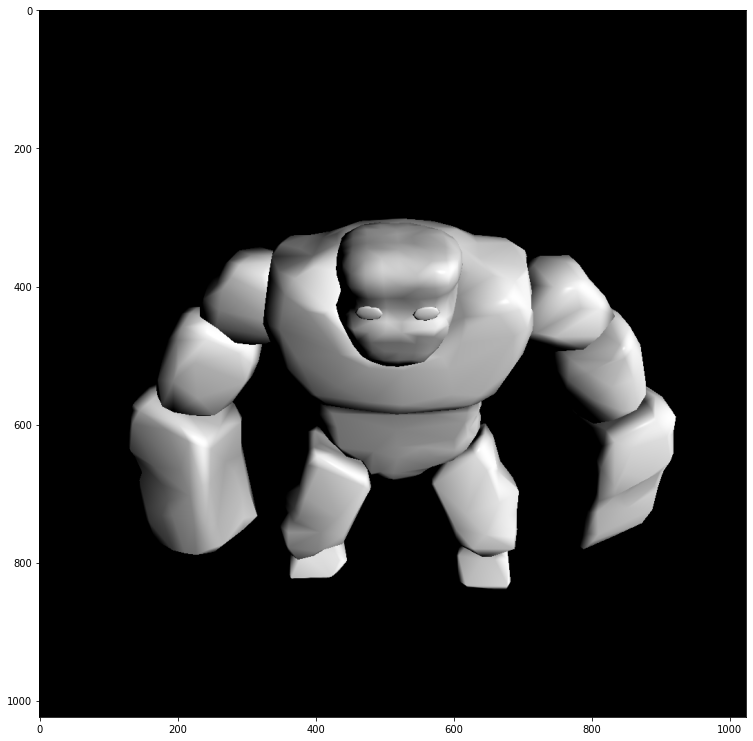

In [ ]:
plt.figure(figsize=(13, 13))
plt.imshow(image_bunny.squeeze())
plt.grid(False)

In [ ]:
# Chamfer loss and normal loss
print("Edge loss for Stone.obj:", mesh_edge_loss(bunny_mesh).item())
print("Edge loss for sphere.obj:", mesh_edge_loss(sphere_mesh).item())

Edge loss for Stone.obj: 0.008667323738336563
Edge loss for sphere.obj: 0.005724199116230011


In [ ]:
loss_chamfer, loss_normals_chamfer = chamfer_distance(
    bunny_vert, 
    sphere_vert, 
    x_normals=bunny_norm,
    y_normals=sphere_norm
)

#%%

print("Chamfer loss =", loss_chamfer.item())
print("Normal loss =", loss_normals_chamfer.item())

Chamfer loss = 0.4154742956161499
Normal loss = 0.7275756597518921


In [ ]:
print("Laplacian smoothing objective for Stone.obj:", mesh_laplacian_smoothing(bunny_mesh).item())
print("Laplacian smoothing objective for sphere.obj:", mesh_laplacian_smoothing(sphere_mesh).item())

Laplacian smoothing objective for Stone.obj: 0.030247200280427933
Laplacian smoothing objective for sphere.obj: 0.0040009506046772


In [ ]:
deform_verts = torch.full(sphere_mesh.verts_packed().shape, 0.0, device=device, requires_grad=True)
optimizer = torch.optim.SGD([deform_verts], lr=1.0, momentum=0.9)

In [ ]:
# Number of optimization steps
Niter = 1001
# Weight for the chamfer loss
w_chamfer = 1.0 
# Weight for mesh edge loss
w_edge = 1.0 
# Weight for mesh normal consistency
w_normal = 0.01 
# Weight for mesh laplacian smoothing
w_laplacian = 0.1 
# Plot period for the losses
plot_period = 50

chamfer_losses = []
laplacian_losses = []
edge_losses = []
normal_losses = []


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """Entry point for launching an IPython kernel.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

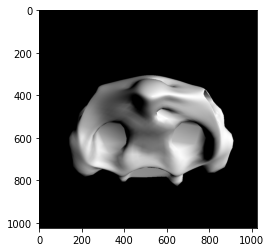

In [ ]:
loop = tqdm_notebook(range(Niter))

%matplotlib inline
fig = plt.figure()
camera = Camera(fig)


for i in loop:
    # Initialize optimizer
    optimizer.zero_grad()
    
    # Deform the mesh
    new_src_mesh = sphere_mesh.offset_verts(deform_verts)
    
    # We sample 5k points from the surface of each mesh 
    sample_trg = sample_points_from_meshes(bunny_mesh, 5000)
    sample_src = sample_points_from_meshes(new_src_mesh, 5000)
    
    # We compare the two sets of pointclouds by computing (a) the chamfer loss
    loss_chamfer, _ = chamfer_distance(sample_trg, sample_src)
    
    # and (b) the edge length of the predicted mesh
    loss_edge = mesh_edge_loss(new_src_mesh)
    
    # mesh normal consistency
    loss_normal = mesh_normal_consistency(new_src_mesh)
    
    # mesh laplacian smoothing
    loss_laplacian = mesh_laplacian_smoothing(new_src_mesh, method="uniform")
    
    # Weighted sum of the losses
    loss = loss_chamfer * w_chamfer + loss_edge * w_edge + loss_normal * w_normal + loss_laplacian * w_laplacian
    
    # Print the losses
    loop.set_description('total_loss = %.6f' % loss)
    
    # Save the losses for plotting
    chamfer_losses.append(loss_chamfer)
    edge_losses.append(loss_edge)
    normal_losses.append(loss_normal)
    laplacian_losses.append(loss_laplacian)
    

    # Plot mesh
    if i % plot_period == 0 or i==0:

        # Render the bunny providing the values of R and T. 
        image_bunny = phong_renderer(meshes_world=new_src_mesh, R=R, T=T)
        image_bunny = image_bunny.detach().cpu().numpy()

        plt.imshow(image_bunny.squeeze())
        plt.grid(False)
        camera.snap()

        
    # Optimization step
    loss.backward()
    optimizer.step()

In [ ]:
animation = camera.animate()
animation.save('deformation_animation.mp4')

Text(0.5, 1.0, 'Loss vs iterations')

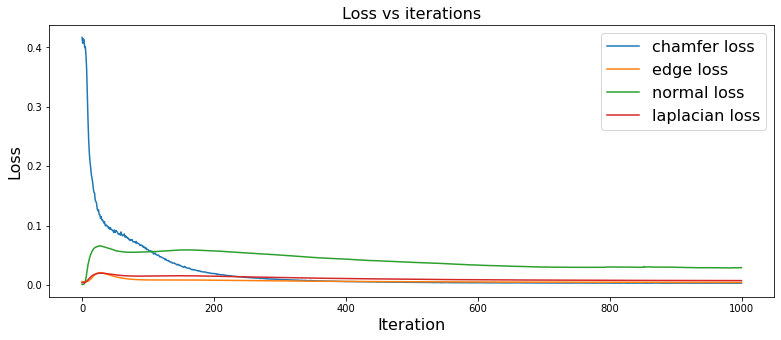

In [ ]:
# Losses evaluation
fig = plt.figure(figsize=(13, 5))
ax = fig.gca()
ax.plot(chamfer_losses, label="chamfer loss")
ax.plot(edge_losses, label="edge loss")
ax.plot(normal_losses, label="normal loss")
ax.plot(laplacian_losses, label="laplacian loss")
ax.legend(fontsize="16")
ax.set_xlabel("Iteration", fontsize="16")
ax.set_ylabel("Loss", fontsize="16")
ax.set_title("Loss vs iterations", fontsize="16")